In [1]:
import sys
sys.path.append('../..')
import numpy as np
from pysrc.clustering import MaxMinClustering
from pysrc.hbpamm import HBPAMM
from pysrc.model import GaussianMixtureModel
from pysrc.pamm import PAMM
from pysrc.plots import cluster_distribution_3D

In [2]:
REF_HB = np.array([0.82, 2.82, 2.74])

# Descriptor calculation

In [3]:
runner = HBPAMM(ta='O', td='O', th='H', cutoff=4.5, 
                weighted=True,
                box='12.4244, 12.4244, 12.4244, 90, 90, 90')

In [4]:
descriptors, weights, pairs = runner.run('h2o-blyp-piglet.xyz')

2.30202112 4.25360095 2.69259933 0.02902873
2.49967554 4.45125537 2.99197918 0.02463838
0.62291489 2.57449472 2.56943865 0.06237020
2.03362905 3.98520888 2.69176492 0.03162743
-2.30202112 4.25360095 2.69259933 0.02902873
-2.49967554 4.45125537 2.99197918 0.02463838
-0.62291489 2.57449472 2.56943865 0.06237020
-2.03362905 3.98520888 2.69176492 0.03162743
0.57911912 2.72515528 2.69259933 0.05237393
2.20858405 4.35462021 2.99197918 0.02372949
2.01145112 4.15748728 2.56943865 0.02939776
2.15007799 4.29611414 4.12508204 0.01752375
2.20739964 4.35343580 2.69176492 0.02638558
-0.57911912 2.72515528 2.69259933 0.05237393
-2.20858405 4.35462021 2.99197918 0.02372949
-2.01145112 4.15748728 2.56943865 0.02939776
-2.15007799 4.29611414 4.12508204 0.01752375
-2.20739964 4.35343580 2.69176492 0.02638558
2.34226519 4.25225911 3.92866686 0.02020874
1.57750709 3.48750102 3.46224074 0.02985593
2.13815953 4.04815345 3.00762119 0.02813928
2.19611792 4.10611184 2.71165105 0.03063656
-2.34226519 4.25225911 

# Grid point generation

In [5]:
ngrid = int(np.sqrt(len(descriptors)))

In [6]:
cluster = MaxMinClustering(ngrid, [26310])
cluster.fit(descriptors)
labels = cluster.predict(descriptors)

Output()

# Do PAMM

In [7]:
pamm = PAMM(descriptors, dimension=3, ngrid=ngrid, sample_weight=weights)
result = pamm.fit(cluster.selected_idx_)

Output()

Output()

Global eff. dim. 1.6976770119107123


Output()

Output()

In [8]:
result.bootstrap(3)

Output()

6 cluster centers


Output()

6 cluster centers


Output()

6 cluster centers


array([[2., 4., 0., ..., 4., 4., 3.],
       [2., 4., 0., ..., 4., 4., 3.],
       [2., 4., 0., ..., 4., 4., 3.]])

# Results

In [9]:
result.cluster_attributes

,labels,probs,pabserr,prelerr,sigma2,flocal,weights,local_dimension,h_trace_normed
0,147,0.257454,1.153849,0.896396,0.392397,0.150001,0.016645,1.718812,0.003655
1,331,-5.736234,-4.801311,0.934922,1.390788,0.149998,0.000126,2.202260,0.006310
2,32,-3.598635,-2.690323,0.908313,1.440011,0.150002,0.000223,2.212838,0.006576
3,427,-5.937209,-4.959035,0.978175,0.815836,0.150001,0.000101,1.893365,0.008684
4,119,-5.050049,-3.805981,1.244067,0.297490,0.150000,0.000640,2.629525,0.001641
...,...,...,...,...,...,...,...,...,...
516,119,-2.648827,-1.761245,0.887582,0.207012,0.149998,0.001614,2.624552,0.001407
517,223,-1.648010,-0.726563,0.921448,0.423531,0.150003,0.001455,1.391384,0.003880
518,331,-1.515115,-0.592016,0.923100,0.278447,0.150000,0.001883,2.056996,0.002943
519,331,-1.729729,-0.816785,0.912944,0.358557,0.150001,0.001951,2.061969,0.003667


## Grid information

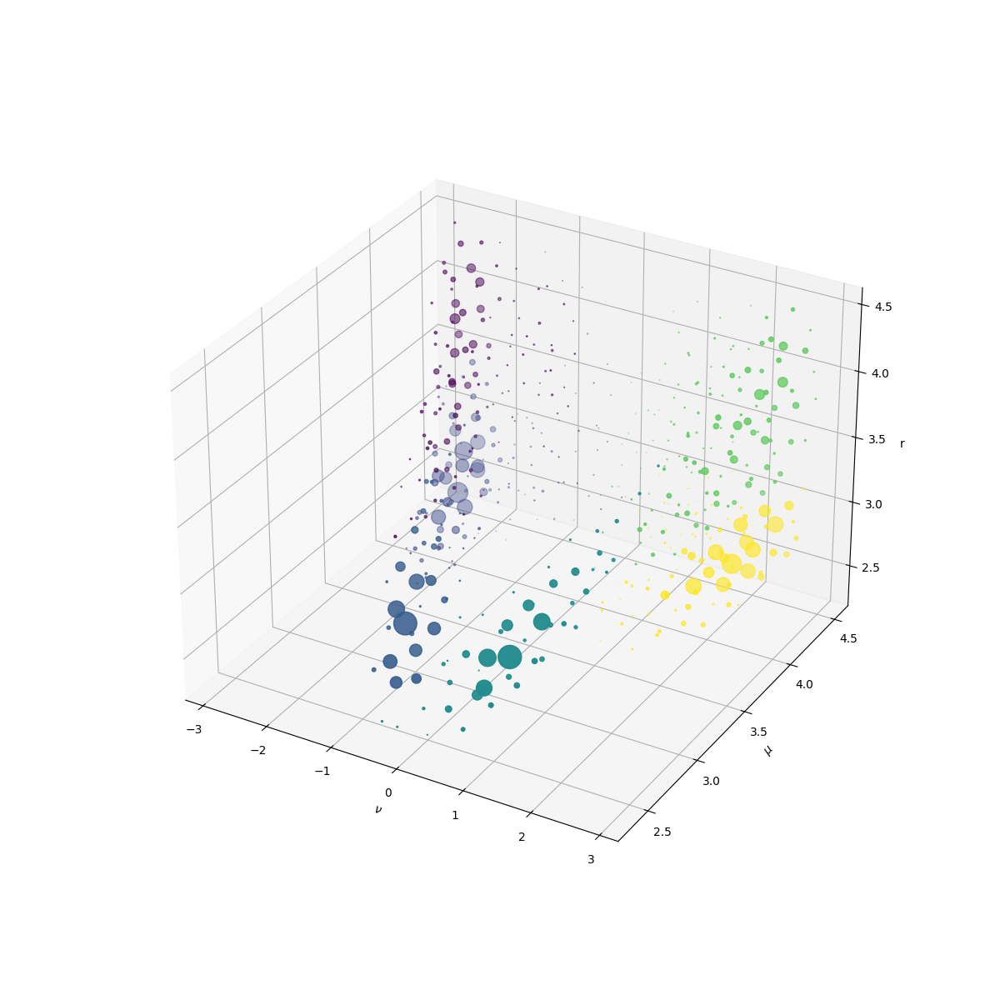

In [10]:
%matplotlib ipympl
fig, ax = cluster_distribution_3D(pamm, label_text=[r'$\nu$', r'$\mu$', r'r'])

In [11]:
gaussian_weights, gaussian_means, gaussian_cov = pamm.generate_probability_model()

In [12]:
hb_cluster = np.argmin(np.linalg.norm(gaussian_means - REF_HB, axis=1))

print(f'The {hb_cluster}th cluster is the cluster closest to the HB reference')

The 3th cluster is the cluster closest to the HB reference


In [13]:
p = GaussianMixtureModel(gaussian_weights, gaussian_means, gaussian_cov)
probs = np.array([p(x, hb_cluster) for x in descriptors])

In [14]:
def split_into_frames(arr, seperate):
    return [arr[seperate[i]:seperate[i+1]] for i in range(len(seperate) - 1)]

def get_s(probs_in_frame, pairs):
    sa = []
    sd = []
    sh = []
    for i, frame in enumerate(pairs):
        idxs = np.array(frame)
        hs = np.unique(idxs[:, 0])
        acceptors = np.unique(idxs[:, 1])
        donors = np.unique(idxs[:, 2])
        for h in hs:
            sh.append(np.sum(probs_in_frame[i][idxs[:, 0] == h]))
        for acceptor in acceptors:
            sa.append(np.sum(probs_in_frame[i][idxs[:, 1] == acceptor]))
        for donor in donors:
            sd.append(np.sum(probs_in_frame[i][idxs[:, 2] == donor]))
    sh = np.array(sh)
    sa = np.array(sa)
    sd = np.array(sd)

    return sh, sa, sd

In [15]:
seperate = [0]
for frame in pairs:
    seperate.append(seperate[-1] + len(frame))

In [16]:
probs_in_frame = split_into_frames(probs, seperate)

In [17]:
sh, sa, sd = get_s(probs_in_frame, pairs)

Text(0.5, 0, '$S_D$')

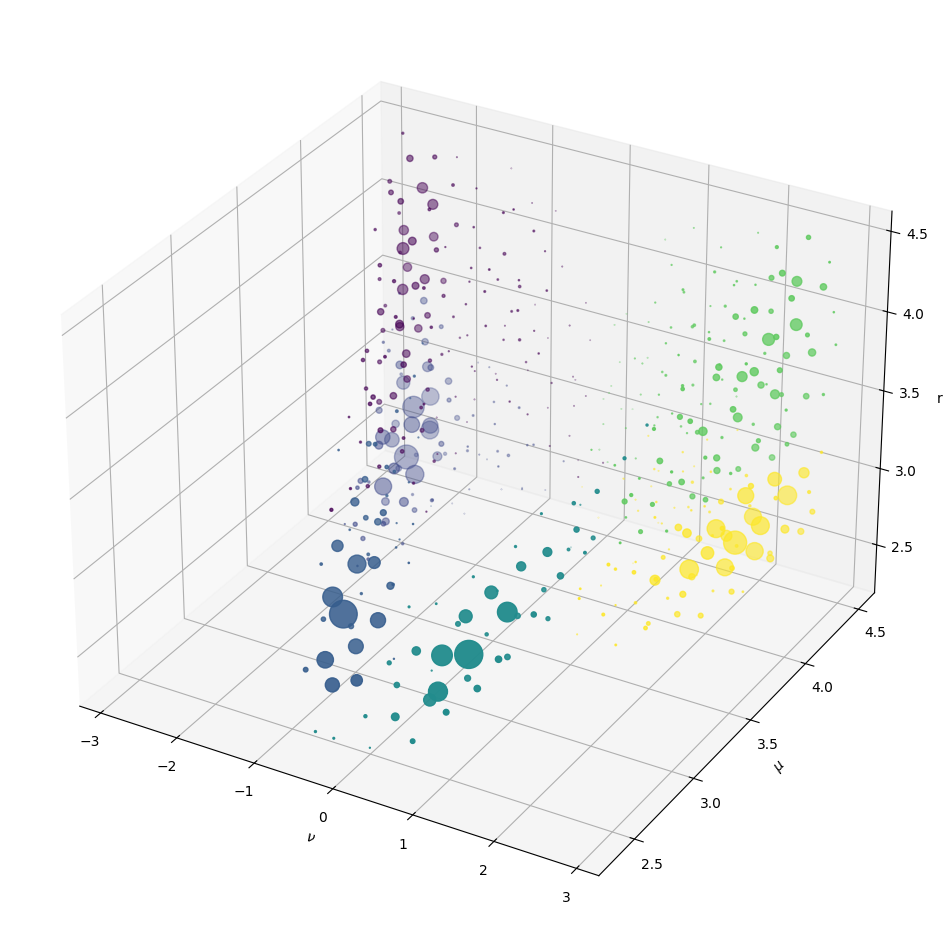

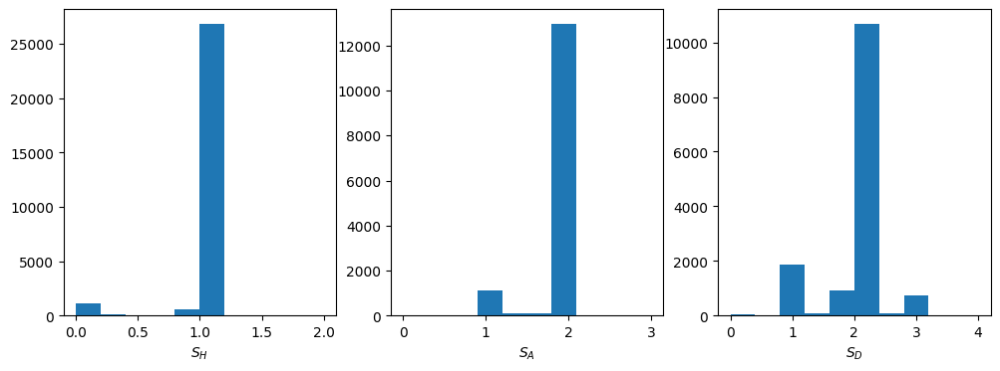

In [18]:
import matplotlib.pyplot as plt
%matplotlib inline
fig, ax = plt.subplots(ncols=3, figsize=(12, 4))
ax[0].hist(sh)
ax[1].hist(sa)
ax[2].hist(sd)
ax[0].set_xlabel('$S_H$')
ax[1].set_xlabel('$S_A$')
ax[2].set_xlabel('$S_D$')